## 1. Packages & Parallel Processing Setup

In [43]:
# Initialize Distributed Workers
using Distributed
if nworkers() == 1
    addprocs(10)
end
@everywhere begin
    using Agents
    using Distributions
    using Plots
    using Random
    using ProgressMeter
end

## 2. Agent definition

In [44]:
@everywhere begin
    # Define Player (0 = defector, 1 = cooperator)
    @agent struct Player(GridAgent{2})
        old_stratagy::Int64
        stratagy::Int64
        payoff::Float64
    end
end

## 3. Dynamics - agent_step! (payoffs)

In [45]:
@everywhere begin
    # calculate the agent's payoff based on neighboring strategies.
    function agent_step!(agent, model)
        agent.payoff = 0.0
        n_coop = 0
        n_total = 0
        for n in nearby_agents(agent, model, 1) # Iterate over neighbors
            n_total += 1 # Count total neighbors
            n_coop += (n.stratagy == 1) # Count cooperating neighbors
        end
        n_def = n_total - n_coop # Calculate number of defecting neighbors

        if agent.stratagy == 1 # If agent is a cooperator
            agent.payoff = n_coop * (model.payoff_benefit - model.payoff_cost) - n_def * model.payoff_cost # Payoff calculation
        else
            agent.payoff = n_coop * model.payoff_benefit # Payoff calculation for defectors
        end
    end
end

## 4. Dynamics - model_step! (update strategy)

In [46]:
@everywhere begin
    # update strategy by comparing payoff with the best neighbor.
    function model_step!(model)

        for a in allagents(model)
            a.old_stratagy = a.stratagy
        end
        # Iterate through all agents to update their strategies
        for a in allagents(model)
            nbs = collect(nearby_agents(a, model, 1)) # Get neighbors of the agent
            maxp = maximum(n.payoff for n in nbs) # Find the maximum payoff among neighbors
            if maxp > a.payoff # If the best neighbor's payoff is greater than the agent's payoff copy strategy
                candidates = [n for n in nbs if n.payoff == maxp] # If multiple neighbors have the same max payoff, randomly select one to copy.
                best_neighbor = rand(candidates)
                if model.symm == true
                    a.stratagy = best_neighbor.old_stratagy
                else
                    a.stratagy = best_neighbor.stratagy
                end
            end
        end
    end
end


## 5. Model initialization

In [47]:
@everywhere begin
    #M is the grid size, 
    # init_coop_freq is the initial fraction of cooperators,
    # b is the benefit, c is the cost, and symm determines if copying is done synchronously or asynchronously.
    function initialize(; M=10, init_coop_freq=0.5, b=0.47, c=0.25, symm=false)
        
        gridsize = (M, M)
        space = GridSpaceSingle(gridsize; periodic=true, metric=:manhattan)

        
        properties = Dict(
            :payoff_benefit => b,
            :payoff_cost    => c,
            :init_coop_freq => init_coop_freq,
            :symm => symm
        )

        model = StandardABM(
            Player, space;
            agent_step!,
            model_step!,
            properties  = properties,
            scheduler   = Schedulers.Randomly() 
        )

        # Calculate how many cooperators and defectors to place initially
        num_coop = round(Int, M^2 * init_coop_freq) # Number of cooperators determined by initial frequency
        num_def  = M^2 - num_coop # Remaining agents are defectors

        strategies = vcat(ones(Int, num_coop), zeros(Int, num_def)) # Create array of strategies
        shuffle!(strategies)  # Shuffle strategies to randomize initial placement

        for s in strategies
            add_agent_single!(model; old_stratagy=s, stratagy=s, payoff=0.0) # Add agents to the model
        end

        return model
    end
end

## 6. Helper - strategies on grid 

In [48]:

# returns a grid of agent strategies
@everywhere function get_strategy_grid(model) 
    grid = zeros(Int, spacesize(model)[1], spacesize(model)[2]) # Initialize grid
    for a in allagents(model) # Fill grid with agent strategies
        grid[a.pos...] = a.stratagy
    end
    return grid
end


## 7. Helper - tree root finder - root degeneracy 

In [49]:
# sub-function for hk algorithm that find the root label for a given label in the union-find structure
@everywhere function find_root(equiv::Vector{Int}, label::Int)
    while equiv[label] != label # Traverse up the tree until the root is found
        label = equiv[label] # Update label to its parent
    end
    return label
end


In [50]:

# sub-function for hk algorithm that unifys two labels in the union-find structure
@everywhere function union!(equiv::Vector{Int}, label1::Int, label2::Int)
    root1 = find_root(equiv, label1) # Find roots of both labels
    root2 = find_root(equiv, label2) # Find root of second label
    if root1 < root2 # Union by smaller root
        equiv[root2] = root1 # Update root of second label to first
    else
        equiv[root1] = root2 # Update root of first label to second
    end
end


## 8. Helper - cluster identification via Hoshen–Kopelman 

In [51]:

# The Hoshen-Kopelman algorithm for cluster identification for periodic boundaries on a 2D grid
@everywhere function hoshen_kopelman_periodic(grid::Array{Int,2}, target::Int=1)
    nrows, ncols = size(grid)
    labels = zeros(Int, nrows, ncols)
    current_label = 1
    equiv = collect(1:(nrows*ncols+1))

    # Pass through the grid and assign labels, merging them if they connect
    for i in 1:nrows
        for j in 1:ncols
            if grid[i, j] == target
                left_label = (j == 1 ? 0 : labels[i, j-1])
                top_label = (i == 1 ? 0 : labels[i-1, j])
                if left_label == 0 && top_label == 0
                    labels[i, j] = current_label
                    current_label += 1
                elseif left_label != 0 && top_label == 0
                    labels[i, j] = left_label
                elseif left_label == 0 && top_label != 0
                    labels[i, j] = top_label
                else
                    chosen_label = min(left_label, top_label)
                    labels[i, j] = chosen_label
                    if left_label != top_label
                        union!(equiv, left_label, top_label)
                    end
                end
            end
        end
    end

    # handle periodic boundaries horizontally
    for i in 1:nrows
        if grid[i, 1] == target && grid[i, ncols] == target
            union!(equiv, labels[i, 1], labels[i, ncols])
        end
    end
    # handle periodic boundaries vertically
    for j in 1:ncols
        if grid[1, j] == target && grid[nrows, j] == target
            union!(equiv, labels[1, j], labels[nrows, j])
        end
    end

    # get union-find root references
    for label in 1:(current_label-1)
        equiv[label] = find_root(equiv, label)
    end

    # update labels to their root labels
    for i in 1:nrows
        for j in 1:ncols
            if labels[i, j] != 0
                labels[i, j] = equiv[labels[i, j]]
            end
        end
    end

    # count cluster sizes
    cluster_sizes = Dict{Int,Int}()
    for i in 1:nrows
        for j in 1:ncols
            l = labels[i, j]
            if l != 0
                cluster_sizes[l] = get(cluster_sizes, l, 0) + 1
            end
        end
    end

    return labels, cluster_sizes
end


## 9.  Helper - running simulation batches

In [ ]:
@everywhere begin
    #  run the model until equilibrium or until it reaches max_steps. 
    function rununtil(model; max_steps=500)
        step = 0
        while step < max_steps
            step!(model, 1)
            stable = true
            for a in allagents(model)
                if a.old_stratagy != a.stratagy
                    stable = false
                    break
                end
            end
            stable && break 
            step += 1
        end
        return step
    end
end

@everywhere begin
    # runs a single trial of the model
    function run_trial(; M=50, init_coop_freq=0.5, symm=true, b=1.0, c=0.25)
        model = initialize(M=M, init_coop_freq=init_coop_freq, symm=symm, b=b, c=c)
        steps = rununtil(model)
        final_coop_frac = mean(a -> a.stratagy == 1, allagents(model))
        grid = get_strategy_grid(model)

        # identify clusters of cooperators
        _, coop_clusters = hoshen_kopelman_periodic(grid, 1)

        # identify clusters of defectors - switch labeling on the grid
        _, def_clusters = hoshen_kopelman_periodic(grid, 0)

        return (steps, final_coop_frac, coop_clusters, def_clusters)
    end

    # run multiple trials and store their results
    function run_trials(; n_trials=100, M=50, init_coop_freq=0.5, symm=true, b=1.0, c=0.25)
        steps_arr = zeros(n_trials)
        coop_frac_arr = zeros(n_trials)
        coop_clusters_list = Vector{Dict{Int,Int}}(undef, n_trials)
        def_clusters_list = Vector{Dict{Int,Int}}(undef, n_trials)

        for trial in 1:n_trials
            steps, final_coop_frac, coop_clusters, def_clusters =
                run_trial(M=M, init_coop_freq=init_coop_freq, symm=symm, b=b, c=c)
            steps_arr[trial] = steps
            coop_frac_arr[trial] = final_coop_frac
            coop_clusters_list[trial] = coop_clusters
            def_clusters_list[trial] = def_clusters
        end

        return (
            steps_arr=steps_arr,
            coop_frac_arr=coop_frac_arr,
            steps_mean=mean(steps_arr),
            coop_frac_mean=mean(coop_frac_arr),
            coop_clusters=coop_clusters_list,
            def_clusters=def_clusters_list
        )
    end
end

## 10. Simulate

In [53]:
# Define the range of costs - set parameters as needed
cost_range = 0:0.025:0.5 # set parameter
symm_range = [false, true]

param_combos = [(c, s, "c = $(c), symm = $(s)") for c in cost_range for s in symm_range]
results_dict = Dict()

p = Progress(length(param_combos), dt=0.1, desc="Running batch experiments")
progress_channel = RemoteChannel(() -> Channel{Int}(1000))

@async begin
    for _ in progress_channel
        next!(p)
    end
end

results_tuples = pmap(x -> begin
        c, s, label = x
        res = run_trials(n_trials=100, M=50, init_coop_freq=0.5, symm=s, b=1.0, c=c) #set parameters
        remotecall_fetch(() -> put!(progress_channel, 1), 1) # Update progress bar
        (label, res)
    end, param_combos)

for (label, run_res) in results_tuples
    results_dict[label] = run_res
end




Running batch experiments 100%|██████████████████████████| Time: 0:01:54


## 11. Helper - build and display plot (cluster histogram)

In [54]:
# plot a combined histogram of cluster sizes for synchronous vs asynchronous updates
function plot_cluster_histogram_combined(results_dict, cost::Real, cluster_type::Symbol; ylog::Bool=false)
    param_label_true = "c = $(cost), symm = true"
    param_label_false = "c = $(cost), symm = false"

    # cluster_list_true contains the clusters for the asynchronous update
    cluster_list_true = if cluster_type == :coop
        results_dict[param_label_true].coop_clusters
    else
        results_dict[param_label_true].def_clusters
    end

    # cluster_list_true contains the clusters for the synchronous update
    cluster_list_false = if cluster_type == :coop
        results_dict[param_label_false].coop_clusters
    else
        results_dict[param_label_false].def_clusters
    end

    # gather all cluster sizes async
    all_true_sizes = Int[]
    for trial in cluster_list_true
        for (_label, size) in trial
            push!(all_true_sizes, size)
        end
    end
    # gather all cluster sizes sync
    all_false_sizes = Int[]
    for trial in cluster_list_false
        for (_label, size) in trial
            push!(all_false_sizes, size)
        end
    end

    unique_sizes_t = size(unique(all_true_sizes))
    unique_sizes_f = size(unique(all_false_sizes))

    yscale_val = ylog ? :log10 : :identity
    bins = maximum([unique_sizes_f unique_sizes_t])

    plt = histogram(all_true_sizes,
        bins=bins,
        xlabel="Cluster Size",
        ylabel="Log(Probability)",
        title="$(cluster_type == :coop ? "Cooperator" : "Defector") Cluster Size Distribution (c = $(cost))",
        label="synchronous",
        alpha=1.0,
        color=:blue,
        legend=:topright,
        yscale=yscale_val,
        normalize=:probability,
        dpi=500,
        fmt=:png)

    histogram!(plt, all_false_sizes,
        bins=bins,
        label="asynchronous",
        alpha=0.5,
        color=:red,
        yscale=yscale_val,
        normalize=:probability,
        dpi=500,
        fmt=:png)

    return plt
end



plot_cluster_histogram_combined (generic function with 1 method)

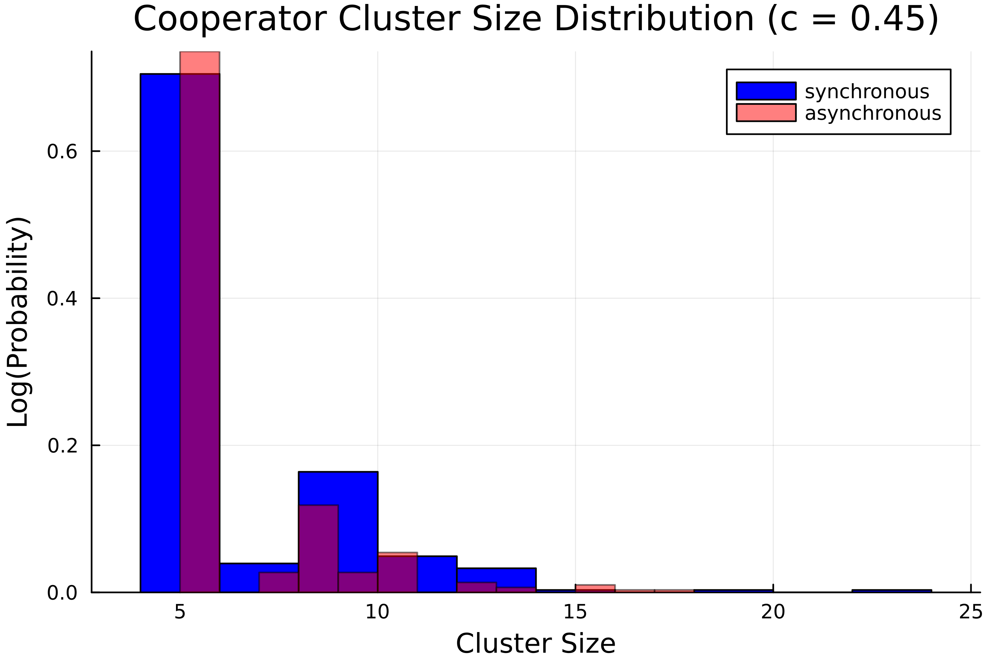

In [55]:
plot_cluster_histogram_combined(results_dict, 0.45, :coop, ylog=false)

## 12. Helper - build and display plot (average cluster size)

In [ ]:
# plot the average cluster size for either cooperators or defectors
# across different cost values, for both synchronous and asynchronous updates.
function plot_avg_cluster_size(results_dict, cluster_type::Symbol)
    cost_values = sort(unique([parse(Float64, match(r"c = ([\d\.]+)", k).captures[1]) for k in keys(results_dict)]))

    mean_cluster_sizes_true = Float64[]
    mean_cluster_sizes_false = Float64[]

    scatter_x_true = Float64[]
    scatter_y_true = Float64[]
    scatter_x_false = Float64[]
    scatter_y_false = Float64[]

    for cost in cost_values
        all_sizes_true = Int[]
        all_sizes_false = Int[]

        for symm in [true, false]
            param_label = "c = $(cost), symm = $(symm)"


            cluster_list =
                cluster_type == :coop ? results_dict[param_label].coop_clusters :
                cluster_type == :defect ? results_dict[param_label].def_clusters :
                []

            for trial in cluster_list
                for (_label, size) in trial
                    if symm
                        push!(all_sizes_true, size)
                        push!(scatter_x_true, cost)
                        push!(scatter_y_true, size)
                    else
                        push!(all_sizes_false, size)
                        push!(scatter_x_false, cost)
                        push!(scatter_y_false, size)
                    end
                end
            end
        end

        push!(mean_cluster_sizes_true, isempty(all_sizes_true) ? NaN : mean(all_sizes_true))
        push!(mean_cluster_sizes_false, isempty(all_sizes_false) ? NaN : mean(all_sizes_false))
    end

    plt = Plots.scatter(scatter_x_true, scatter_y_true,
        xlabel="Cost",
        ylabel="Cluster Size",
        title="$(cluster_type == :coop ? "Cooperator" : "Defector")",
        markercolor=:blue,
        marker=:diamond,
        alpha=0.3,
        markersize=4,
        label=:none,
        dpi=500,
        fmt=:png)

    Plots.scatter!(plt, scatter_x_false, scatter_y_false,
        markercolor=:red,
        alpha=0.3,
        markersize=3,
        label=:none,
        dpi=500,
        fmt=:png)

    Plots.plot!(plt, cost_values, mean_cluster_sizes_true,
        linewidth=3,
        marker=:diamond,
        label="Mean Synchronous",
        color=:blue,
        dpi=500,
        fmt=:png)

    Plots.plot!(plt, cost_values, mean_cluster_sizes_false,
        linewidth=3,
        marker=:o,
        label="Mean Asynchronous",
        color=:red,
        dpi=500,
        fmt=:png)

    return plt
end




plot_avg_cluster_size (generic function with 1 method)

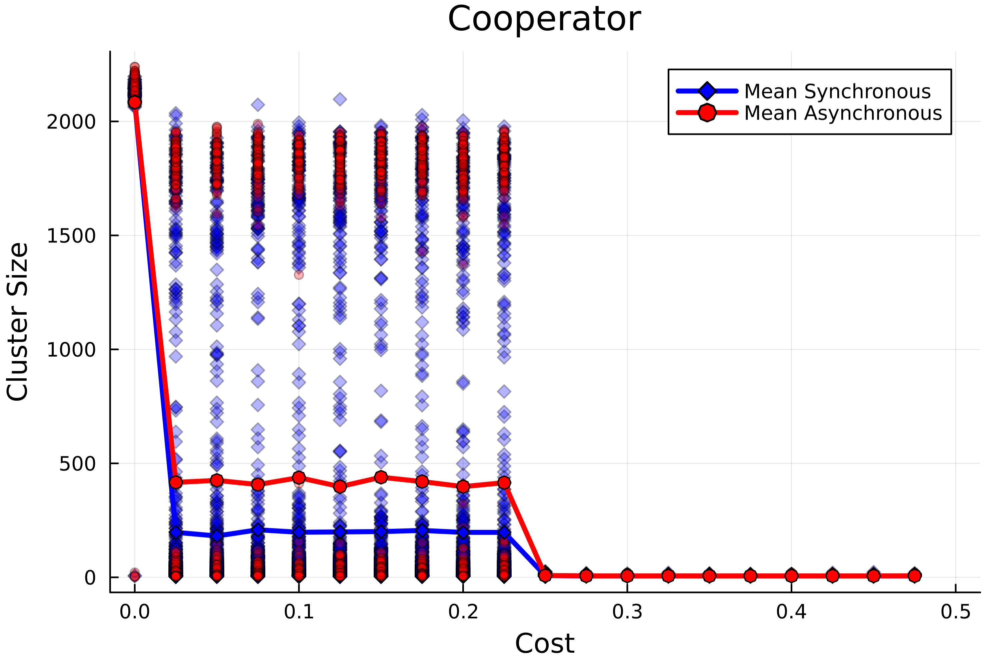

In [57]:
# Plot cluster size for cooperators vs cost
plot_avg_cluster_size(results_dict, :coop)

## 13. Helper - build and display plot (frequency vs cost)

In [ ]:
# plot how final cooperator frequency changes with cost, 
function plot_coop_frequency_vs_cost(results_dict)
    cost_values = sort(unique([parse(Float64, match(r"c = ([\d\.]+)", k).captures[1]) for k in keys(results_dict)]))

    mean_freq_true = Float64[]
    mean_freq_false = Float64[]

    scatter_x_true = Float64[]
    scatter_y_true = Float64[]
    scatter_x_false = Float64[]
    scatter_y_false = Float64[]

    for cost in cost_values
        all_freqs_true = Float64[]
        all_freqs_false = Float64[]

        for symm in [true, false]
            param_label = "c = $(cost), symm = $(symm)"


            freq_list = results_dict[param_label].coop_frac_arr

            for freq in freq_list
                if symm
                    push!(all_freqs_true, freq)
                    push!(scatter_x_true, cost)
                    push!(scatter_y_true, freq)
                else
                    push!(all_freqs_false, freq)
                    push!(scatter_x_false, cost)
                    push!(scatter_y_false, freq)
                end
            end
        end

        push!(mean_freq_true, isempty(all_freqs_true) ? NaN : mean(all_freqs_true))
        push!(mean_freq_false, isempty(all_freqs_false) ? NaN : mean(all_freqs_false))
    end

    plt = Plots.scatter(scatter_x_true, scatter_y_true,
        xlabel="Cost",
        ylabel="Cooperator Frequency",
        label=:none,
        markercolor=:blue,
        marker=:diamond,
        alpha=0.5,
        markersize=3)

    Plots.scatter!(plt, scatter_x_false, scatter_y_false,
        label=:none,
        markercolor=:red,
        alpha=0.5,
        markersize=3)

    Plots.plot!(plt, cost_values, mean_freq_true,
        linewidth=2,
        marker=:diamond,
        color=:blue,
        label="Mean Synchronous")

    Plots.plot!(plt, cost_values, mean_freq_false,
        linewidth=2,
        marker=:o,
        color=:red,
        label="Mean Asynchronous",
        dpi=500,
        fmt=:png)

    return plt
end



plot_coop_frequency_vs_cost (generic function with 1 method)

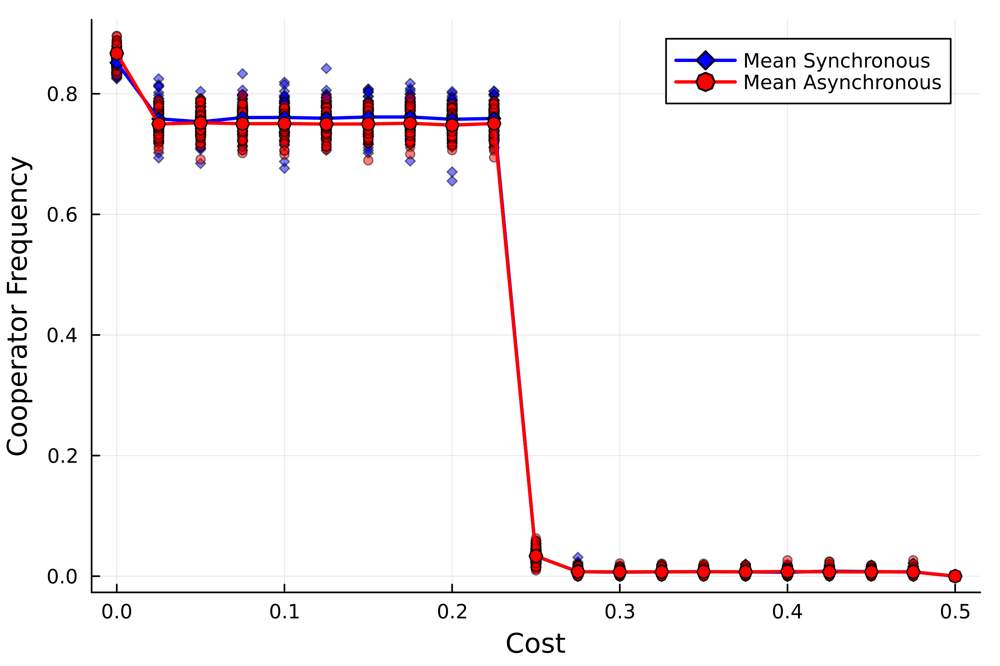

In [59]:
# Plotting the cooperator frequency vs cost
plot_coop_frequency_vs_cost(results_dict)

## 14. Helper - build and display plot (time to equilibrium vs cost)

In [ ]:
# plot how many steps it takes the model to reach equilibrium (unless it fails and hits 500 steps).
# exclude runs that took 500 steps, which indicates the system is in a limit cycle (if M is not too large)
function plot_filtered_ticks_to_equilibrium_vs_cost(results_dict)
    cost_values = sort(unique([parse(Float64, match(r"c = ([\d\.]+)", k).captures[1]) for k in keys(results_dict)]))

    mean_ticks_true = Float64[]
    mean_ticks_false = Float64[]

    scatter_x_true = Float64[]
    scatter_y_true = Float64[]
    scatter_x_false = Float64[]
    scatter_y_false = Float64[]

    for cost in cost_values
        all_ticks_true = Int[]
        all_ticks_false = Int[]

        for symm in [true, false]
            param_label = "c = $(cost), symm = $(symm)"


            ticks_list = results_dict[param_label].steps_arr

            for ticks in ticks_list
                if ticks < 500  # only consider runs that converged before hitting max steps
                    if symm
                        push!(all_ticks_true, ticks)
                        push!(scatter_x_true, cost)
                        push!(scatter_y_true, ticks)
                    else
                        push!(all_ticks_false, ticks)
                        push!(scatter_x_false, cost)
                        push!(scatter_y_false, ticks)
                    end
                end
            end

        end

        push!(mean_ticks_true, isempty(all_ticks_true) ? NaN : mean(all_ticks_true))
        push!(mean_ticks_false, isempty(all_ticks_false) ? NaN : mean(all_ticks_false))
    end

    plt = Plots.scatter(scatter_x_true, scatter_y_true,
        xlabel="Cost",
        ylabel="Ticks",
        title="Ticks to Equilibrium (Excluding Limit Cycles)",
        label=:none,
        markercolor=:blue,
        alpha=0.5,
        markersize=3)

    Plots.scatter!(plt, scatter_x_false, scatter_y_false,
        label=:none,
        markercolor=:red,
        alpha=0.5,
        markersize=3)

    Plots.plot!(plt, cost_values, mean_ticks_true,
        linewidth=2,
        marker=:o,
        color=:blue,
        label="Mean Synchronous")

    Plots.plot!(plt, cost_values, mean_ticks_false,
        linewidth=2,
        marker=:o,
        color=:red,
        label="Mean Asynchronous",
        dpi=500,
        fmt=:png)

    return plt
end



plot_filtered_ticks_to_equilibrium_vs_cost (generic function with 1 method)

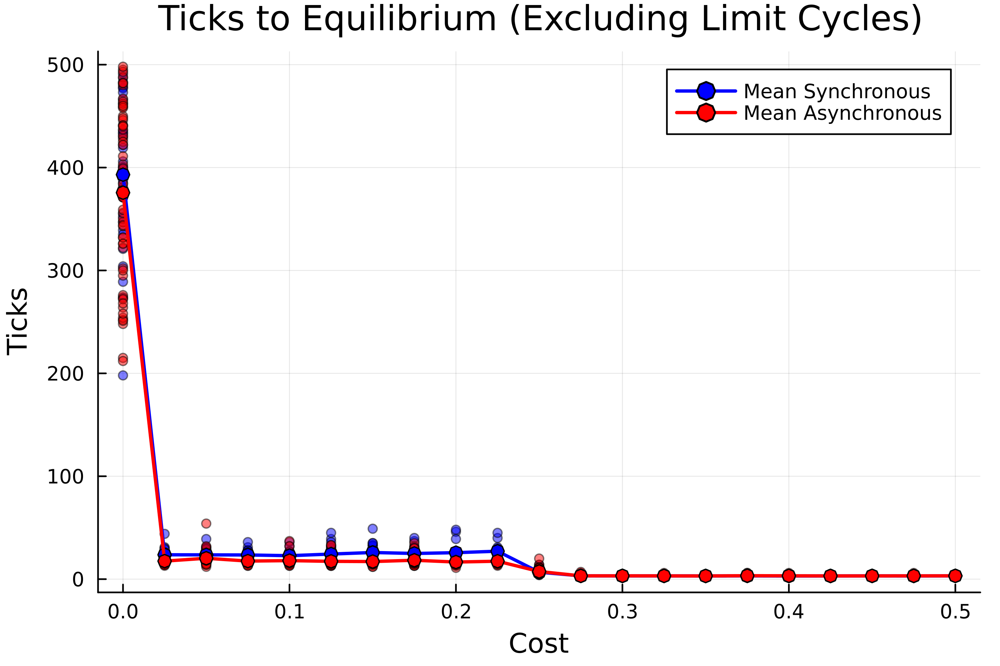

In [61]:
# Plotting the ticks to equilibrium vs cost
plot_filtered_ticks_to_equilibrium_vs_cost(results_dict)